<a href="https://colab.research.google.com/github/subhayuroy/3D_Eye/blob/master/FetaureExtraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
get_ipython().system_raw("unrar x Village_Dataset.rar")

In [ ]:
import os
list = os.listdir('/content/Village_Dataset/geotagged-images')
for i in range(len(list)):
  print(list[i])

IMG_7744.JPG
IMG_7726.JPG
IMG_7723.JPG
IMG_7741.JPG
IMG_7751.JPG
IMG_7719.JPG
IMG_7740.JPG
IMG_7732.JPG
IMG_7743.JPG
IMG_7752.JPG
IMG_7733.JPG
IMG_7747.JPG
IMG_7722.JPG
IMG_7745.JPG
IMG_7728.JPG
IMG_7729.JPG
IMG_7737.JPG
IMG_7746.JPG
IMG_7731.JPG
IMG_7742.JPG
IMG_7724.JPG
IMG_7755.JPG
IMG_7727.JPG
IMG_7754.JPG
IMG_7736.JPG
IMG_7730.JPG
IMG_7721.JPG
IMG_7720.JPG
IMG_7749.JPG
IMG_7735.JPG
IMG_7734.JPG
IMG_7750.JPG
IMG_7738.JPG
IMG_7748.JPG
IMG_7753.JPG
IMG_7739.JPG
IMG_7725.JPG


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


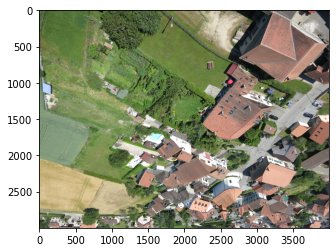

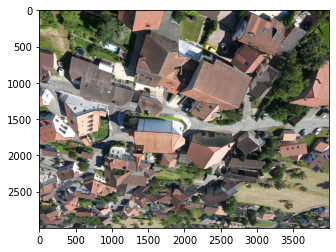

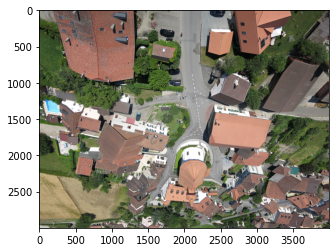

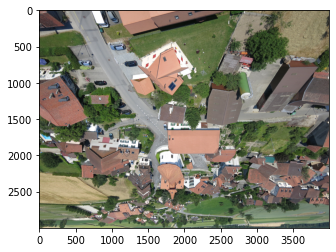

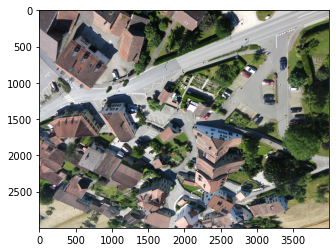

...

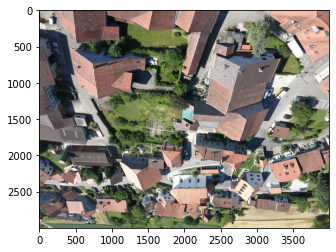

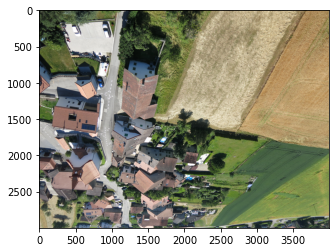

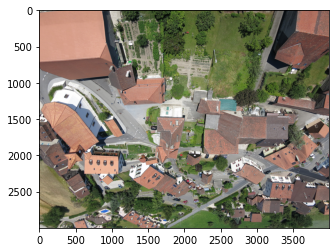

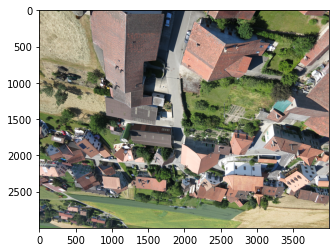

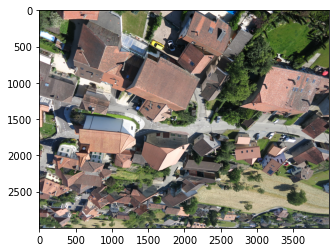

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def process(filename):
    image = mpimg.imread('/content/Village_Dataset/geotagged-images/'+filename)
    plt.figure()
    plt.imshow(image)

for file in list:
    process(file)

In [ ]:
!pip install opencv-contrib-python==3.4.2.16

     |████████████████████████████████| 30.6MB 153kB/s 
  Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30


##Applying Transformations

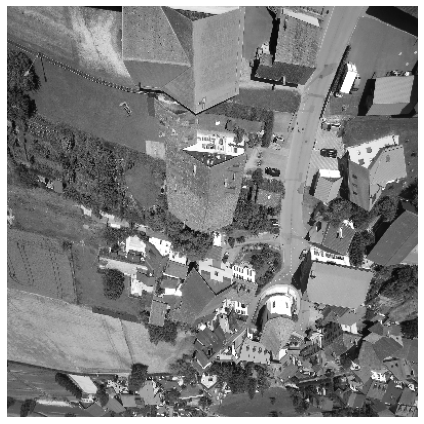

In [7]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
plt.rc('figure', autolayout=True)
plt.rc('axes', labelweight='bold', labelsize='large',
       titleweight='bold', titlesize=18, titlepad=10)
plt.rc('image', cmap='magma')

image_path = '/content/IMG_7743.JPG'
image = tf.io.read_file(image_path)
image = tf.io.decode_jpeg(image, channels=1)
image = tf.image.resize(image, size=[400, 400])

plt.figure(figsize=(6, 6))
plt.imshow(tf.squeeze(image), cmap='gray')
plt.axis('off')
plt.show();

In [3]:
!git clone https://github.com/Kaggle/learntools.git
!mv learntools learntools_dir
!mv learntools_dir/learntools learntools
from learntools.deep_learning import decode_predictions

Cloning into 'learntools'...
remote: Enumerating objects: 326, done.
remote: Counting objects: 100% (326/326), done.
remote: Compressing objects: 100% (189/189), done.
remote: Total 14997 (delta 208), reused 208 (delta 135), pack-reused 14671
Receiving objects: 100% (14997/14997), 103.04 MiB | 16.13 MiB/s, done.
Resolving deltas: 100% (11065/11065), done.


##Some Standard Kernels

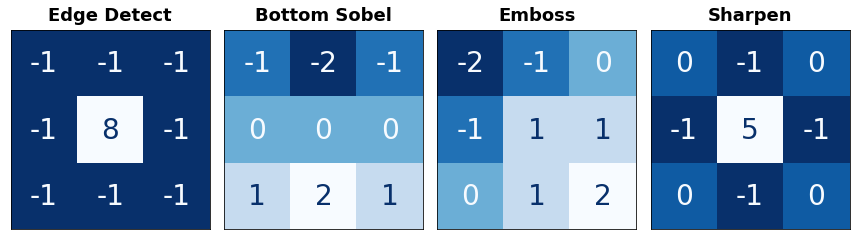

In [8]:
import learntools.computer_vision.visiontools as visiontools
from learntools.computer_vision.visiontools import edge, bottom_sobel, emboss, sharpen

kernels = [edge, bottom_sobel, emboss, sharpen]
names = ["Edge Detect", "Bottom Sobel", "Emboss", "Sharpen"]

plt.figure(figsize=(12, 12))
for i, (kernel, name) in enumerate(zip(kernels, names)):
    plt.subplot(1, 4, i+1)
    visiontools.show_kernel(kernel)
    plt.title(name)
plt.tight_layout()

### "Edge Detect" Kernel

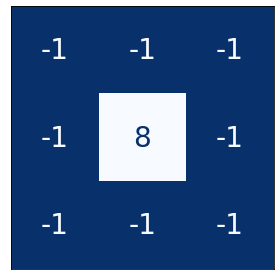

In [ ]:
kernel = tf.constant([
    [-1, -1, -1],
    [-1,  8, -1],
    [-1, -1, -1],
])

visiontools.show_kernel(kernel)

***Filtering image***

In [ ]:
image = tf.image.convert_image_dtype(image, dtype=tf.float32)
image = tf.expand_dims(image, axis=0)
kernel = tf.reshape(kernel, [*kernel.shape, 1, 1])
kernel = tf.cast(kernel, dtype=tf.float32)

###Apply Convolution

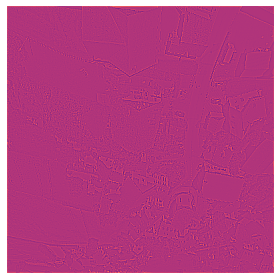

In [ ]:
image_filter = tf.nn.conv2d(
    input=image,
    filters=kernel,
    strides=1, # or (1, 1)
    padding='SAME',
)

plt.imshow(
    tf.squeeze(image_filter)
)
plt.axis('off')
plt.show();

###Apply ReLU

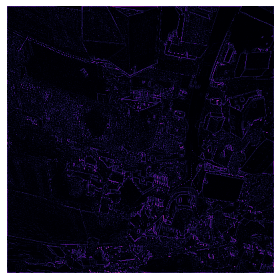

In [ ]:
image_detect = tf.nn.relu(image_filter)

plt.imshow(
    tf.squeeze(image_detect)
)
plt.axis('off')
plt.show();

### Apply Pooling to Condense

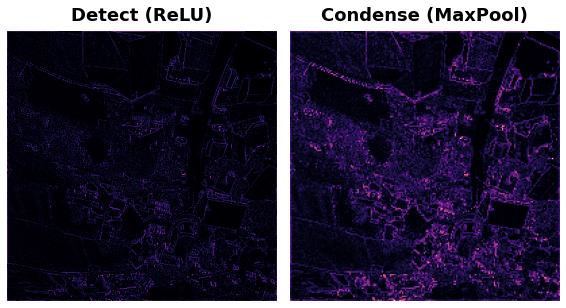

In [ ]:
image_condense = tf.nn.pool(
                input=image_detect,
                window_shape=(2,2),
                pooling_type='MAX',
                strides=(2,2),
                padding='SAME',
)

plt.figure(figsize=(8, 6))
plt.subplot(121)
plt.imshow(tf.squeeze(image_detect))
plt.axis('off')
plt.title("Detect (ReLU)")
plt.subplot(122)
plt.imshow(tf.squeeze(image_condense))
plt.axis('off')
plt.title("Condense (MaxPool)")
plt.show();

### "Bottom Sobel" Kernel

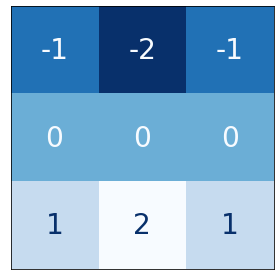

In [ ]:
kernel = tf.constant([
    [-1, -2, -1],
    [0,  0, 0],
    [1, 2, 1],
])

visiontools.show_kernel(kernel)

In [ ]:
image = tf.image.convert_image_dtype(image, dtype=tf.float32)
image = tf.expand_dims(image, axis=0)
kernel = tf.reshape(kernel, [*kernel.shape, 1, 1])
kernel = tf.cast(kernel, dtype=tf.float32)

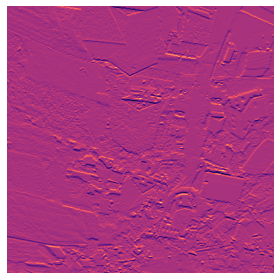

In [ ]:
image_filter = tf.nn.conv2d(
    input=image,
    filters=kernel,
    strides=1, # or (1, 1)
    padding='SAME',
)

plt.imshow(
    tf.squeeze(image_filter)
)
plt.axis('off')
plt.show();

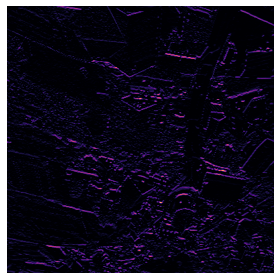

In [ ]:
image_detect = tf.nn.relu(image_filter)

plt.imshow(
    tf.squeeze(image_detect)
)
plt.axis('off')
plt.show();

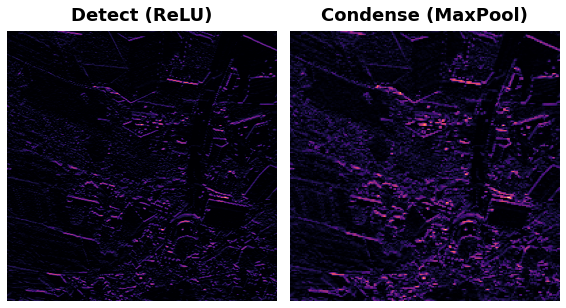

In [ ]:
image_condense = tf.nn.pool(
                input=image_detect,
                window_shape=(2,2),
                pooling_type='MAX',
                strides=(2,2),
                padding='SAME',
)

plt.figure(figsize=(8, 6))
plt.subplot(121)
plt.imshow(tf.squeeze(image_detect))
plt.axis('off')
plt.title("Detect (ReLU)")
plt.subplot(122)
plt.imshow(tf.squeeze(image_condense))
plt.axis('off')
plt.title("Condense (MaxPool)")
plt.show();

### "Sharpen" Kernel

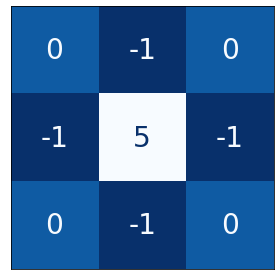

In [ ]:
kernel = tf.constant([
    [0, -1, 0],
    [-1,  5, -1],
    [0, -1, 0],
])

visiontools.show_kernel(kernel)

In [ ]:
image = tf.image.convert_image_dtype(image, dtype=tf.float32)
image = tf.expand_dims(image, axis=0)
kernel = tf.reshape(kernel, [*kernel.shape, 1, 1])
kernel = tf.cast(kernel, dtype=tf.float32)

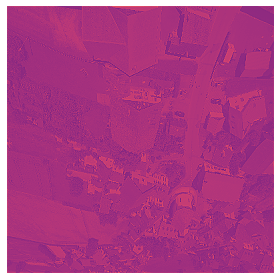

In [ ]:
image_filter = tf.nn.conv2d(
    input=image,
    filters=kernel,
    strides=1, # or (1, 1)
    padding='SAME',
)

plt.imshow(
    tf.squeeze(image_filter)
)
plt.axis('off')
plt.show();

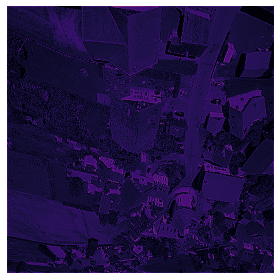

In [ ]:
image_detect = tf.nn.relu(image_filter)

plt.imshow(
    tf.squeeze(image_detect)
)
plt.axis('off')
plt.show();

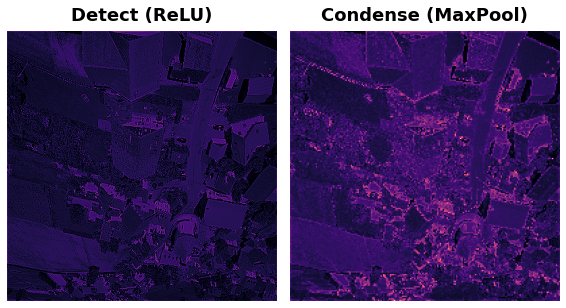

In [ ]:
image_condense = tf.nn.pool(
                input=image_detect,
                window_shape=(2,2),
                pooling_type='MAX',
                strides=(2,2),
                padding='SAME',
)

plt.figure(figsize=(8, 6))
plt.subplot(121)
plt.imshow(tf.squeeze(image_detect))
plt.axis('off')
plt.title("Detect (ReLU)")
plt.subplot(122)
plt.imshow(tf.squeeze(image_condense))
plt.axis('off')
plt.title("Condense (MaxPool)")
plt.show();

### "Emboss" Kernel

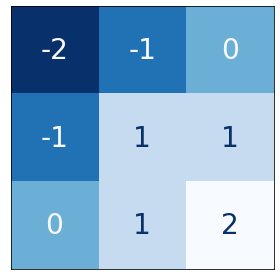

In [ ]:
kernel = tf.constant([
    [-2, -1, 0],
    [-1, 1, 1],
    [0, 1, 2],
])

visiontools.show_kernel(kernel)

In [ ]:
image = tf.image.convert_image_dtype(image, dtype=tf.float32)
image = tf.expand_dims(image, axis=0)
kernel = tf.reshape(kernel, [*kernel.shape, 1, 1])
kernel = tf.cast(kernel, dtype=tf.float32)

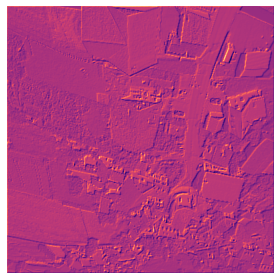

In [ ]:
image_filter = tf.nn.conv2d(
    input=image,
    filters=kernel,
    strides=1, # or (1, 1)
    padding='SAME',
)

plt.imshow(
    tf.squeeze(image_filter)
)
plt.axis('off')
plt.show();

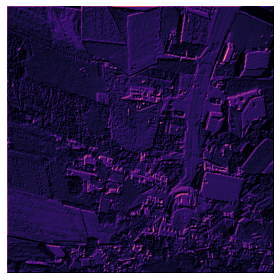

In [ ]:
image_detect = tf.nn.relu(image_filter)

plt.imshow(
    tf.squeeze(image_detect)
)
plt.axis('off')
plt.show();

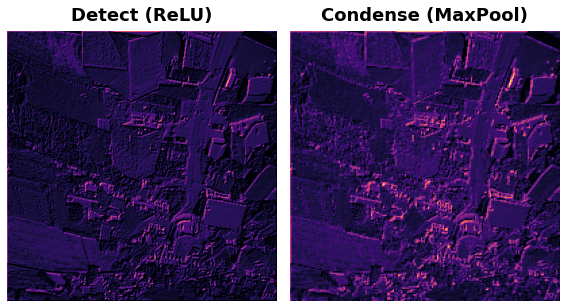

In [ ]:
image_condense = tf.nn.pool(
                input=image_detect,
                window_shape=(2,2),
                pooling_type='MAX',
                strides=(2,2),
                padding='SAME',
)

plt.figure(figsize=(8, 6))
plt.subplot(121)
plt.imshow(tf.squeeze(image_detect))
plt.axis('off')
plt.title("Detect (ReLU)")
plt.subplot(122)
plt.imshow(tf.squeeze(image_condense))
plt.axis('off')
plt.title("Condense (MaxPool)")
plt.show();

##Observing Convolution and ReLU on a Numerical Matrix

⎡0  1  0  0  0  0⎤
⎢                ⎥
⎢0  1  0  0  0  0⎥
⎢                ⎥
⎢0  1  0  0  0  0⎥
⎢                ⎥
⎢0  1  0  0  0  0⎥
⎢                ⎥
⎢0  1  0  1  1  1⎥
⎢                ⎥
⎣0  1  0  0  0  0⎦

⎡1  -1⎤
⎢     ⎥
⎣1  -1⎦

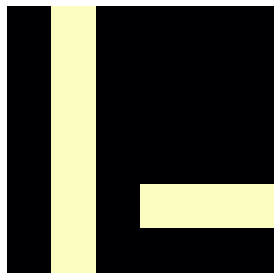

In [ ]:
import sympy
sympy.init_printing()
from IPython.display import display

image = np.array([
    [0, 1, 0, 0, 0, 0],
    [0, 1, 0, 0, 0, 0],
    [0, 1, 0, 0, 0, 0],
    [0, 1, 0, 0, 0, 0],
    [0, 1, 0, 1, 1, 1],
    [0, 1, 0, 0, 0, 0],
])

kernel = np.array([
    [1, -1],
    [1, -1],
])

plt.imshow(image)
plt.axis('off')

display(sympy.Matrix(image))
display(sympy.Matrix(kernel))

# Reformat for Tensorflow
image = tf.cast(image, dtype=tf.float32)
image = tf.reshape(image, [1, *image.shape, 1])
kernel = tf.reshape(kernel, [*kernel.shape, 1, 1])
kernel = tf.cast(kernel, dtype=tf.float32)

⎡-2.0  2.0  0.0   0.0  0.0⎤
⎢                         ⎥
⎢-2.0  2.0  0.0   0.0  0.0⎥
⎢                         ⎥
⎢-2.0  2.0  0.0   0.0  0.0⎥
⎢                         ⎥
⎢-2.0  2.0  -1.0  0.0  0.0⎥
⎢                         ⎥
⎣-2.0  2.0  -1.0  0.0  0.0⎦

⎡0.0  2.0  0.0  0.0  0.0⎤
⎢                       ⎥
⎢0.0  2.0  0.0  0.0  0.0⎥
⎢                       ⎥
⎢0.0  2.0  0.0  0.0  0.0⎥
⎢                       ⎥
⎢0.0  2.0  0.0  0.0  0.0⎥
⎢                       ⎥
⎣0.0  2.0  0.0  0.0  0.0⎦

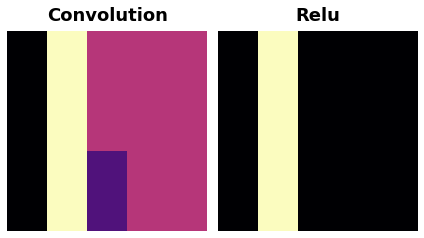

In [ ]:
image_filter = tf.nn.conv2d(
    input=image,
    filters=kernel,
    strides=1,
    padding='VALID',
)

image_detect = tf.nn.relu(image_filter)

# The first matrix is the image after convolution, and the second is the image after ReLU.
display(sympy.Matrix(tf.squeeze(image_filter).numpy()))
display(sympy.Matrix(tf.squeeze(image_detect).numpy()))

IMAGE = [image_filter, image_detect]
title = ["Convolution", "Relu"]
for i in range(2):
  plt.subplot(1,2,i+1)
  plt.title(title[i])
  plt.imshow(tf.squeeze(IMAGE[i]))
  plt.axis('off')
plt.show()

###Testing Max Pooling on a random Circle

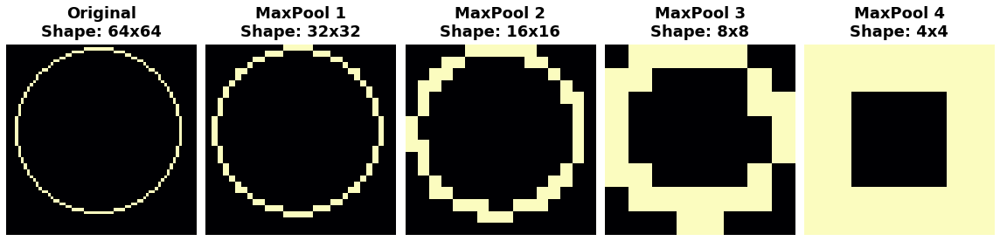

In [10]:
REPEATS = 4
SIZE = [64, 64]

# Create a randomly shifted circle
image = visiontools.circle(SIZE, r_shrink=4, val=1)
image = tf.expand_dims(image, axis=-1)
image = visiontools.random_transform(image, jitter=3, fill_method='replicate')
image = tf.squeeze(image)

plt.figure(figsize=(16, 4))
plt.subplot(1, REPEATS+1, 1)
plt.imshow(image, vmin=0, vmax=1)
plt.title("Original\nShape: {}x{}".format(image.shape[0], image.shape[1]))
plt.axis('off')

# Now condense with maximum pooling several times
for i in range(REPEATS):
    ax = plt.subplot(1, REPEATS+1, i+2)
    image = tf.reshape(image, [1, *image.shape, 1])
    image = tf.nn.pool(image, window_shape=(2,2), strides=(2, 2), padding='SAME', pooling_type='MAX')
    image = tf.squeeze(image)
    plt.imshow(image, vmin=0, vmax=1)
    plt.title("MaxPool {}\nShape: {}x{}".format(i+1, image.shape[0], image.shape[1]))
    plt.axis('off')

###Global Average Pooling

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


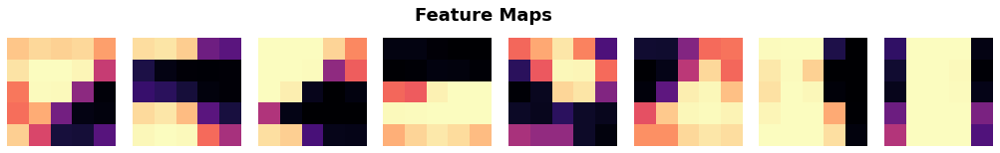

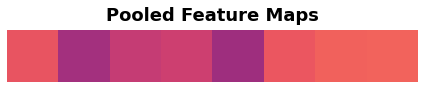

In [12]:
import matplotlib.gridspec as gridspec

feature_maps = [visiontools.random_map([5, 5], scale=0.1, decay_power=4) for _ in range(8)]

gs = gridspec.GridSpec(1, 8, wspace=0.01, hspace=0.01)
plt.figure(figsize=(18, 2))
for i, feature_map in enumerate(feature_maps):
    plt.subplot(gs[i])
    plt.imshow(feature_map, vmin=0, vmax=1)
    plt.axis('off')
plt.suptitle('Feature Maps', size=18, weight='bold', y=1.1)
plt.show()

# reformat for TensorFlow
feature_maps_tf = [tf.reshape(feature_map, [1, *feature_map.shape, 1])
                   for feature_map in feature_maps]

global_avg_pool = tf.keras.layers.GlobalAvgPool2D()
pooled_maps = [global_avg_pool(feature_map) for feature_map in feature_maps_tf]
img = np.array(pooled_maps)[:,:,0].T

plt.imshow(img, vmin=0, vmax=1)
plt.axis('off')
plt.title('Pooled Feature Maps')
plt.show();